# EA614 - Análises de Sinais
## EFC4 - Amostragem
### Bryan Wolff - RA: 214095



## Bibliotecas Utilizadas

In [ ]:
!pip install pysoundfile

In [ ]:
import math
import numpy as np
import matplotlib.pyplot as plt 
from scipy import signal
from IPython.display import Audio
from scipy.io import wavfile
import cffi
import librosa
import IPython.display as ipd

## Rotinas Disponibilizadas

### Rotina de Espectro

In [ ]:
""" Rotina que exibe o espectro de magnitude (X(ejw)) de um sinal discreto """
def espectro(y):

    #modulo da transf. de Fourier
    Y = np.abs(np.fft.fft(y))
    #frequencias avaliadas
    w = np.linspace(0,2*math.pi,Y.size)

    #exibe o grafico do espectro
    plt.figure() 
    plt.plot(w,Y/np.max(Y))
    plt.title("Espectro de frequências do sinal")
    plt.xlabel('$\Omega$ [rad]', fontsize=10)
    plt.ylabel('|$Y(e^{j\Omega})$|', fontsize=10)
    plt.grid(True)
    plt.xlim((0,2*math.pi))
    plt.show()
    
    #return Y

### Rotina de Kaiser

In [ ]:
def kaiser(wp,wr):

    wc = (wp + wr)/2
    d = 0.01
    Ap = 20*math.log10((1+d)/(1-d))
    Ar = -20*math.log10(d)

    if Ar < 21:
        b = 0
        D = .9222

    elif Ar < 50:
        b = 0.5842*(Ar-21)**0.4+0.07886*(Ar-21)
        D = (Ar - 7.95)/14.36
    else:
        b = .1102*(Ar-8.7)
        D = (Ar - 7.95)/14.36

    k = math.ceil(math.pi*D/(wr-wp)-.5)
    M = 2*k+1

    n = np.arange(-k,k+1,1)
    
    w = np.i0(b*np.sqrt(1-(4/M**2)*n**2))
    w = np.divide(w,np.i0(b))

    h = wc/math.pi*np.sinc(wc*n/math.pi)*w

    return h

## Questão A - *Importação do Áudio*

O áudio utilizado para estudo é a música **Under Pressure** da banda **Queen** e para carregá-lo, ele foi importado nos arquivos do Colab e será utilizada a biblioteca **librosa** com uma taxa de amostragem de 44,1 kHz.


In [ ]:
audio, fs = librosa.load('Queen_Under_Pressure.wav',sr=44100)

#Áudio original
ipd.Audio(audio,rate=fs)

## Questão B - *Espectro de Frequências do Áudio Original*

Utilizando a rotina de espectro fornecida pelo professor foi possível gerar 
o espectro de frequências do sinal de áudio, como mostrado abaixo. Nele, é possível observar que o sinal concentra-se em frequências baixas, ou seja, possui uma banda limitada. Além disso, o sinal pode ser considerado periódico, uma vez que, a partir de 3 radianos, o espectro se repete de maneira espelhada.

Além disso, a frequência de amostragem (ωs) é maior que duas vezes a velocidade de variação do sinal (ωm), não ocorrendo o fenomeno de aliasing por respeitar a condição de Nyquist.


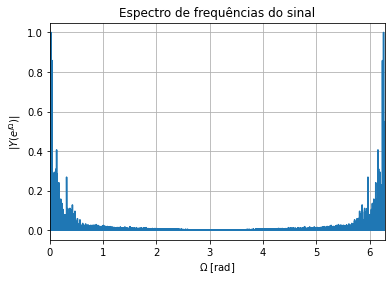

In [ ]:
espectro(audio)

## Questão C - *Decimação do Espectro*

Neste item, foi implementada uma função de decimação que reduz a taxa de amostragem por um fator de M. Dado M = 6, a representação de seu espectro é demonstrada logo abaixo. Neste caso, nota-se que a condição de Nyquist não foi respeitada, havendo sobreposição de componentes do espectro, podendo também verificar a ocorrência do do fenômeno de aliasing.

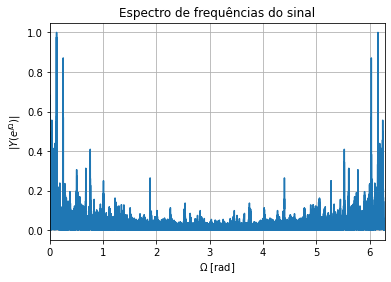

In [ ]:
#rotina de decimação que reduz a taxa de amostragem por um fator de M
def decimacao(espec, M):
  dec = []
  for i in range(0,len(espec), M):
    dec.append(espec[i])
  return dec

#dado o fator M = 6
audio_dec = decimacao(audio, 6)

#A partir da rotina de espectro obtem-se o seguinte espectro do áudio decimado
espectro(audio_dec)





## Questão D - *Áudio Subamostrado*

Ouvindo o áudio original e o áudio subamostrado, aquele que passou pelo processo de decimação tem um perda considerável na qualidade do áudio, devido a presença de ruídos ao decorrer da música e a sensação de um som mais abafado.


In [ ]:
#Áudio decimado
ipd.Audio(audio_dec,rate=fs/6)

## Questão E - *Resposta em Frequência dos Filtros*

Para este item, a rotina kaiser será utilizada para gerar um FPB recebendo como parâmetros a frequência de passagem (Ωp) e a frequência de rejeição (Ωr) retornando a resposta ao impulso do filtro que será representada a partir da rotina espectro disponibilizada.

Dessa forma, será definidos 3 Filtros:

**• Filtro 1 (FPB1):** Ωp = 0.45 rad, Ωr = 2 rad;

**• Filtro 2 (FPB2):** Ωp = 0.45 rad, Ωr = 0.5 rad;

**• Filtro 3 (FPB3):** Ωp = 1.5 rad, Ωr = 2 rad.

A partir da análise dos espectros de frequência de cada filtro é possível concluir que o segundo filtro FPB é o que mais se aproxima de um caso ideal, devido ao fato da frequência de passagem mais se aproximar da frequência de rejeição. E sabemos que no caso ideal a *frequência de passagem* = *frequência de rejeição* e quanto menor a diferença entre estas duas frequências, mais próximo do ideal o filtro se encontra.

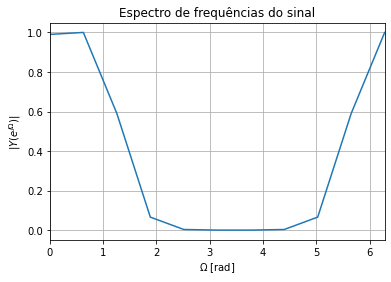

In [ ]:
#Filtro 1
FPB1 = kaiser(0.45,2)
espectro(FPB1)

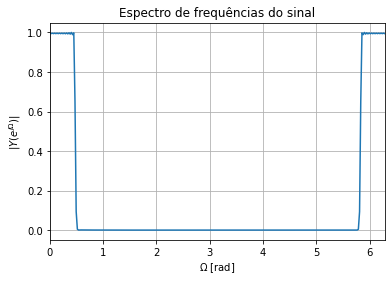

In [ ]:
#Filtro 2
FPB2 = kaiser(0.45,0.5)
espectro(FPB2)

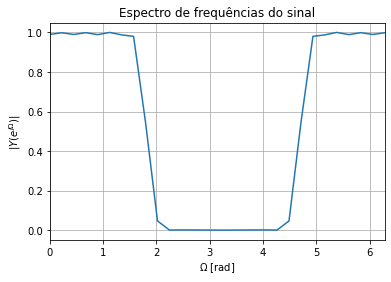

In [ ]:
#Filtro 3
FPB3 = kaiser(1.5,2)
espectro(FPB3)

## Questão F - *Filtragem*

O áudio foi filtrado através da convolução do sinal original e do Filtro 2. Ao analisar seu espectro, observa-se que para valores de frequência acima de 0.5 rad o sinal é nulo. Esta filtragem preserva as frequências mais baixas do áudio, que corresponde a maior parte do sinal.

Ao ouvir o áudio, ainda é notável uma qualidade inferior e uma sensação de um som abafado, quando em comparação com o original. Porém, os ruídos prosentes do audio subamostrado não são mais notados.

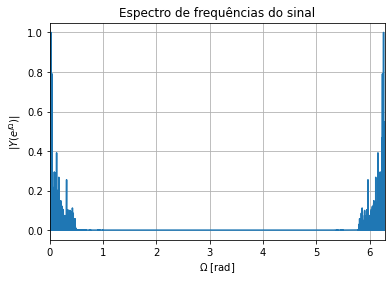

In [ ]:
#Convolução entre o sinal original e filtro FPB 2
audio_filtrado = signal.convolve(audio,FPB2)

#Plot do espectro
espectro(audio_filtrado)

#Áudio filtrado
ipd.Audio(audio_filtrado,rate=fs)

## Questão G - *Decimação do Espectro Filtrado*

Utilizando a rotina de decimação implementada no item C, será feita a decimação do o sinal obtido no item F (ou seja, o sinal pré-filtrado pelo FPB de Kaiser) por um fator M = 6.

Comparando o espectro obtido abaixo com aquele obtido no item C, nota-se uma diferença na região próxima a 3 rad, onde no sinal em questão apresenta valores nulo, não ocorrerrendo o fenômeno de aliasing, uma vez que a condição de Nyquist é respeitada. Analisando os dois áudios, não é mais possível escutar a presença dos ruídos causados, de maneira geral, pelo fenômeno de aliasing, porém, este áudio apresenta qualidade inferior a do áudio original.

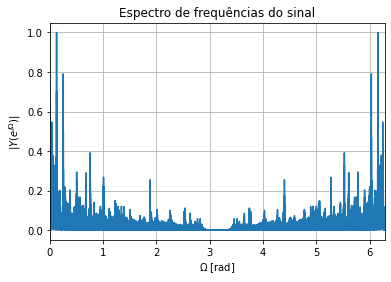

In [ ]:
#decimação do audio filtrado dado o fator M = 6
audio_filtrado_dec = decimacao(audio_filtrado, 6)

#Plot do espectro
espectro(audio_filtrado_dec)

#Áudio filtrado e decimado
ipd.Audio(audio_filtrado_dec,rate=fs/6)